In [57]:
import cv2
import numpy as np
from skimage.filters import threshold_otsu
import matplotlib.pyplot as plt

In [58]:
def removeLines(img):
    image= cv2.imread(img,0) # reads image as grayscale

    # use gaussian filter to smooth the image
    binary= cv2.GaussianBlur(image,(3,3),10)

    # use otsu thresholding for accurate conversion to binary image
    thresh = threshold_otsu(image)
    binary = image > thresh

    # convert binary image to uint8 with 255 as white and 0 as black
    binary = binary.astype(np.uint8)*255
    binary_inv = cv2.bitwise_not(binary)
    # Identifying the horizontal lines
    horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (50, 1))
    detected_lines = cv2.morphologyEx(binary_inv, cv2.MORPH_OPEN,
    horizontal_kernel, iterations=1)

    # dialate the detected lines
    detected_lines = cv2.dilate(detected_lines, np.ones((3,2)), iterations=1)

    # Erode the detected lines
    detected_lines = cv2.erode(detected_lines, np.ones((3,2)), iterations=1)

    # invert the detected lines lengthwise
    detected_lines = cv2.dilate(detected_lines, np.ones((1,5)), iterations=1)

    # GaussianBlur the detected lines
    detected_lines= cv2.GaussianBlur(detected_lines,(3,3),10)
    detected_lines_inv = cv2.bitwise_not(detected_lines)


    plt.imshow(detected_lines, cmap='gray')
    plt.title('Detected Lines')
    plt.axis('off')
    plt.show()

    newimg= cv2.inpaint(image,detected_lines,1,cv2.INPAINT_TELEA)
    plt.imshow(newimg, cmap='gray',)
    plt.title('Inpainted Image')
    plt.axis('off')
    plt.show()

    plt.imsave('output1.jpg',newimg,cmap='gray')

    return newimg

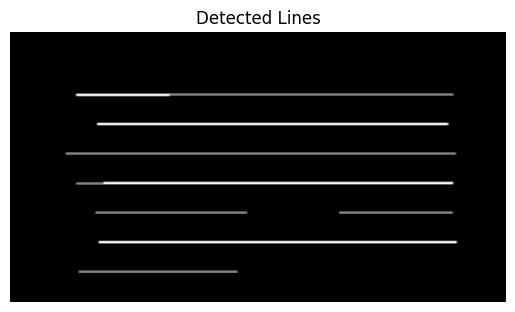

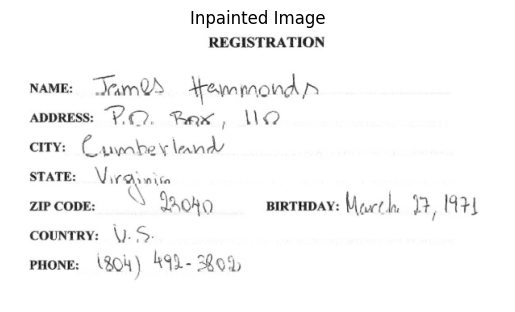

In [60]:
lines_removed=removeLines('document.jpg')

In [62]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def text_segmentation(image_path):
    # Load the image
    image = cv2.imread(image_path)

    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply thresholding to obtain a binary image
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # dialation of image
    binary=cv2.dilate(binary, np.ones((3,10)), iterations=1)
    plt.imshow(binary,cmap="gray")
    plt.show()

    # Find connected components
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)

    # Initialize list to store word bounding boxes
    word_boxes = []
    for label in range(1, num_labels):
        x, y, w, h, area = stats[label]
        if area < 100:
            continue
        word_boxes.append((x, y, w, h))
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Segmented Text with Bounding Boxes')
    plt.axis('off')

    # Save the displayed image
    output2_path = 'output2.jpg'
    plt.savefig(output2_path)
    print("Segmented image with bounding boxes saved as:", output2_path)

    # Show the displayed image
    plt.show()

    # Save the segmented image with bounding boxes
    cv2.imwrite('output2_opencv.jpg', cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    print("Segmented image with bounding boxes saved as: output2_opencv.jpg")

    return word_boxes


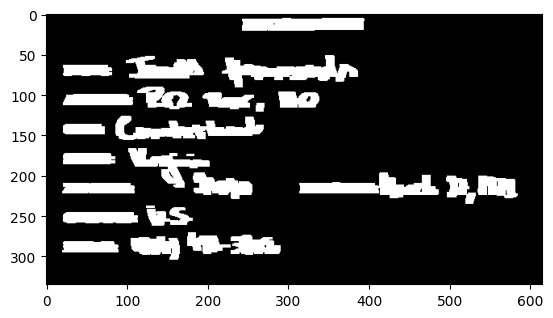

Segmented image with bounding boxes saved as: output2.jpg


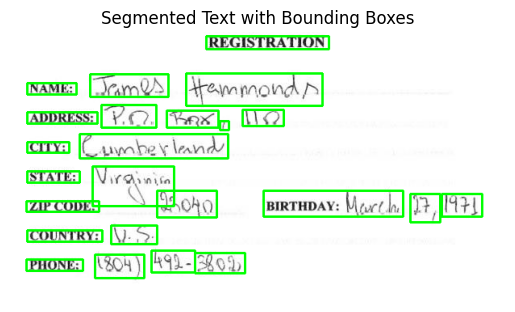

Segmented image with bounding boxes saved as: output2_opencv.jpg


In [63]:
boundingBoxes=text_segmentation("output1.jpg")

In [64]:
def calculate_deviations(word_boxes):
    # Extract width, height, and area of each bounding box
    widths = [box[2] for box in word_boxes]
    heights = [box[3] for box in word_boxes]
    areas = [box[2] * box[3] for box in word_boxes]
    avg_width = sum(widths) / len(widths)
    avg_height = sum(heights) / len(heights)
    avg_area = sum(areas) / len(areas)
    deviations = {
        'DW': [abs(w - avg_width) for w in widths],
        'DH': [abs(h - avg_height) for h in heights],
        'DA': [abs(a - avg_area) for a in areas]
    }

    return deviations

deviations = calculate_deviations(boundingBoxes)
print("Deviation of Widths (DW):", deviations['DW'])
print("Deviation of Heights (DH):", deviations['DH'])
print("Deviation of Areas (DA):", deviations['DA'])


Deviation of Widths (DW): [69.375, 14.375, 86.375, 21.625, 14.625, 31.625, 18.625, 4.375, 71.625, 101.375, 30.625, 18.375, 17.625, 8.625, 90.375, 45.625, 32.625, 7.375, 25.625, 10.375, 28.625, 20.625, 21.625, 12.625]
Deviation of Heights (DH): [7.791666666666668, 4.208333333333332, 16.208333333333332, 9.791666666666668, 4.208333333333332, 3.791666666666668, 2.791666666666668, 9.791666666666668, 12.791666666666668, 6.208333333333332, 10.791666666666668, 25.208333333333332, 9.791666666666668, 9.208333333333332, 8.208333333333332, 11.208333333333332, 4.208333333333332, 10.791666666666668, 0.7916666666666679, 9.791666666666668, 3.208333333333332, 1.2083333333333321, 5.208333333333332, 9.791666666666668]
Deviation of Areas (DA): [322.125, 606.125, 4650.125, 1255.875, 205.875, 1089.875, 765.875, 891.875, 1988.875, 3410.125, 1433.875, 2839.125, 1199.875, 332.125, 3426.125, 814.875, 709.875, 939.875, 798.875, 807.875, 651.875, 559.875, 340.875, 1129.875]


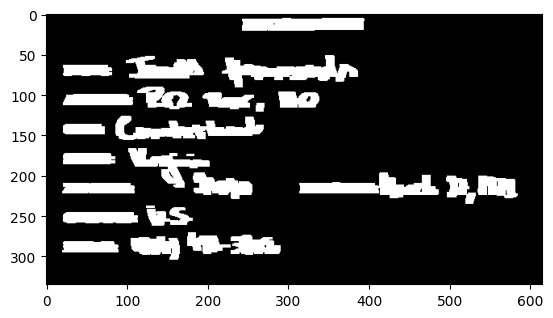

Segmented image with bounding boxes saved as: output2.jpg


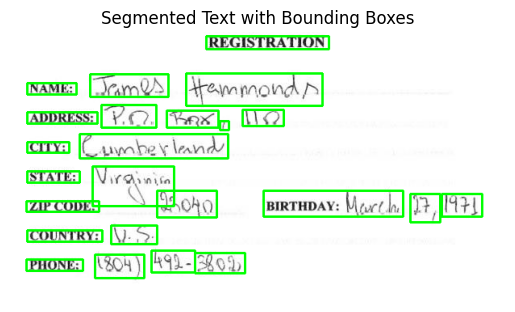

Segmented image with bounding boxes saved as: output2_opencv.jpg
Densities: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0008210180623973727, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.000180635838150289, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0010204081632653062]
Vertical Projection Variances: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.011362135024441798, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.005746934411440408, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.014081632653061227]


In [65]:
def calculate_density(binary_img, bounding_box):
    # Extract the coordinates of the bounding box
    x, y, w, h = bounding_box
    roi = binary_img[y:y+h, x:x+w]
    black_pixel_area = np.sum(roi == 0)
    total_area = w * h
    density = black_pixel_area / total_area

    return density

def calculate_vertical_projection_variance(binary_img, bounding_box):
    # Extract the coordinates of the bounding box
    x, y, w, h = bounding_box
    roi = binary_img[y:y+h, x:x+w]
    vertical_projection = np.sum(roi == 0, axis=0)
    vertical_projection_variance = np.var(vertical_projection)

    return vertical_projection_variance

binary_image = cv2.imread('output1.jpg', cv2.IMREAD_GRAYSCALE)
word_boxes = text_segmentation('output1.jpg')

densities = []
vertical_projection_variances = []

for box in word_boxes:
    density = calculate_density(binary_image, box)
    vertical_projection_variance = calculate_vertical_projection_variance(binary_image, box)
    densities.append(density)
    vertical_projection_variances.append(vertical_projection_variance)

print("Densities:", densities)
print("Vertical Projection Variances:", vertical_projection_variances)

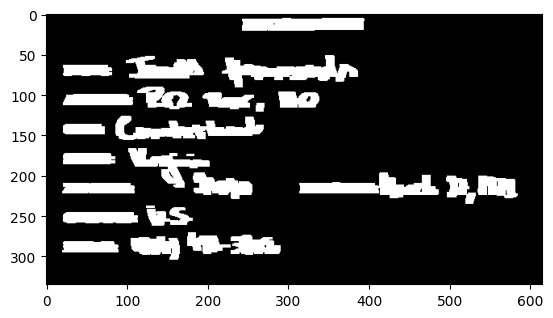

Segmented image with bounding boxes saved as: output2.jpg


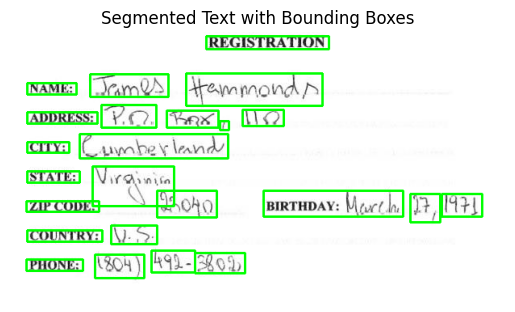

Segmented image with bounding boxes saved as: output2_opencv.jpg
Word 1: MHPD = 18446744073709551614, PD = 0.0
Word 2: MHPD = 18446744073709551615, PD = 0.0
Word 3: MHPD = 18446744073709551614, PD = 0.0
Word 4: MHPD = 18446744073709551604, PD = 0.0
Word 5: MHPD = 18446744073709551609, PD = 0.0
Word 6: MHPD = 18446744073709551592, PD = 0.0
Word 7: MHPD = 18446744073709551610, PD = 0.0
Word 8: MHPD = 18446744073709551615, PD = 0.0011494252873563218
Word 9: MHPD = 18446744073709551608, PD = 0.0
Word 10: MHPD = 18446744073709551615, PD = 0.0
Word 11: MHPD = 18446744073709551614, PD = 0.0
Word 12: MHPD = 18446744073709551612, PD = 0.0
Word 13: MHPD = 18446744073709551613, PD = 0.0
Word 14: MHPD = 18446744073709551606, PD = 0.0
Word 15: MHPD = 18446744073709551615, PD = 0.0002627430373095113
Word 16: MHPD = 18446744073709551610, PD = 0.0
Word 17: MHPD = 18446744073709551612, PD = 0.0
Word 18: MHPD = 18446744073709551609, PD = 0.0
Word 19: MHPD = 18446744073709551613, PD = 0.0
Word 20: MHPD =

In [66]:
def calculate_pixels_distribution(binary_image, box):
    x, y, w, h = box
    upper_roi = binary_image[y:y+h-10, x:x+w]
    lower_roi = binary_image[y+h-10:y+h, x:x+w]

    upper_density = np.sum(upper_roi == 0) / upper_roi.size if upper_roi.size > 0 else 0
    lower_density = np.sum(lower_roi == 0) / lower_roi.size if lower_roi.size > 0 else 0

    pd = np.abs(upper_density - lower_density)

    return pd

def calculate_major_horizontal_projection_difference(binary_img, bounding_box):
    # Extract the coordinates of the bounding box
    x, y, w, h = bounding_box
    roi = binary_img[y:y+h, x:x+w]
    horizontal_projection = np.sum(roi, axis=0)
    major_diff = np.max(np.abs(np.diff(horizontal_projection)))

    return major_diff

def plot_word_with_features(binary_image, word_boxes):
    for i, box in enumerate(word_boxes):
        mhp_diff = calculate_major_horizontal_projection_difference(binary_img, box)
        pd_diff = calculate_pixels_distribution(binary_img, box)
        print(f'Word {i+1}: MHPD = {mhp_diff}, PD = {pd_diff}')

# Usage example
binary_img = cv2.imread('output1.jpg', cv2.IMREAD_GRAYSCALE)
word_boxes = text_segmentation('output1.jpg')
plot_word_with_features(binary_img, word_boxes)


In [67]:
def calculate_bottom_line(binary_image, box):
    x, y, w, h = box
    bottom_line_pixels = np.sum(binary_image[y+h-1, x:x+w] == 0)
    bottom_line_ratio = bottom_line_pixels / w
    return bottom_line_ratio

# Usage example
bottom_line_ratio = calculate_bottom_line(binary_img, word_boxes[0])
print("Bottom Line Ratio:", bottom_line_ratio)


Bottom Line Ratio: 0.0


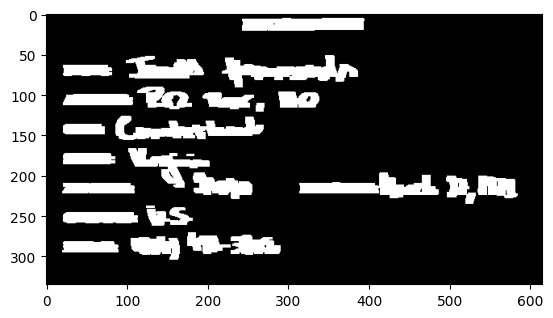

Segmented image with bounding boxes saved as: output2.jpg


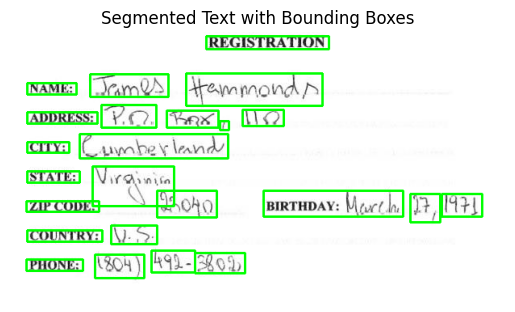

Segmented image with bounding boxes saved as: output2_opencv.jpg
Word 1: Black Pixels Each Line = 0.0, Vertical Edges = 5.542763157894737
Word 2: Black Pixels Each Line = 0.0, Vertical Edges = 4.898379970544919
Word 3: Black Pixels Each Line = 0.0, Vertical Edges = 3.67810650887574
Word 4: Black Pixels Each Line = 0.0, Vertical Edges = 5.400468384074942
Word 5: Black Pixels Each Line = 0.0, Vertical Edges = 4.663865546218488
Word 6: Black Pixels Each Line = 0.0, Vertical Edges = 5.231372549019608
Word 7: Black Pixels Each Line = 0.0, Vertical Edges = 4.845238095238095
Word 8: Black Pixels Each Line = 0.011494252873563218, Vertical Edges = 5.073891625615763
Word 9: Black Pixels Each Line = 0.0, Vertical Edges = 4.297520661157025
Word 10: Black Pixels Each Line = 0.0, Vertical Edges = 4.405797101449275
Word 11: Black Pixels Each Line = 0.0, Vertical Edges = 5.218934911242603
Word 12: Black Pixels Each Line = 0.0, Vertical Edges = 4.089715093958375
Word 13: Black Pixels Each Line = 0.0, V

In [68]:
def calculate_black_pixels_each_line(binary_image, box):
    x, y, w, h = box
    line_counts = []
    for i in range(y, y+h):
        line_roi = binary_image[i:i+1, x:x+w]
        black_pixels = np.sum(line_roi == 0)
        line_counts.append(black_pixels / w)
    return sum(line_counts)

def calculate_vertical_edges(binary_image, box):
    x, y, w, h = box
    bb_roi = binary_image[y:y+h, x:x+w]
    prewitt_kernel_x = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
    prewitt_kernel_y = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])

    edges_x = cv2.filter2D(bb_roi, -1, prewitt_kernel_x)
    edges_y = cv2.filter2D(bb_roi, -1, prewitt_kernel_y)

    total_edge_length = np.sum(np.sqrt(edges_x**2 + edges_y**2))

    # Calculate the feature by dividing by the BB area
    bb_area = w * h
    return total_edge_length / bb_area

def calculate_features(binary_image, word_boxes):
    for i, box in enumerate(word_boxes):
        bpel = calculate_black_pixels_each_line(binary_image, box)
        ve = calculate_vertical_edges(binary_image, box)
        print(f'Word {i+1}: Black Pixels Each Line = {bpel}, Vertical Edges = {ve}')

# Load the binary image and segment text to obtain word bounding boxes
binary_image = cv2.imread('output1.jpg', cv2.IMREAD_GRAYSCALE)
word_boxes = text_segmentation('output1.jpg')

# Calculate and print features for each word bounding box
calculate_features(binary_image, word_boxes)

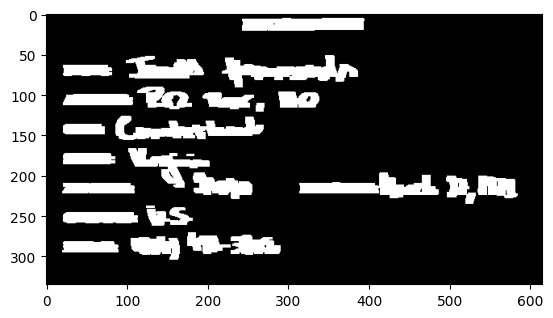

Segmented image with bounding boxes saved as: output2.jpg


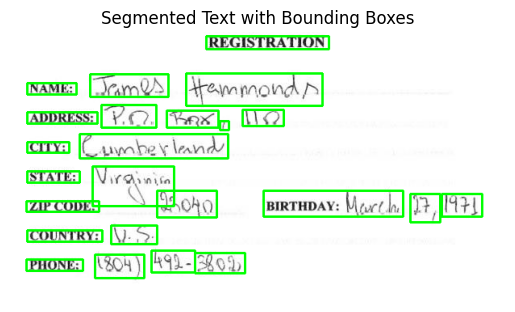

Segmented image with bounding boxes saved as: output2_opencv.jpg
Word 1: Major Vertical Edge = 1.0
Word 2: Major Vertical Edge = 0.75
Word 3: Major Vertical Edge = 0.875
Word 4: Major Vertical Edge = 1.0
Word 5: Major Vertical Edge = 0.8214285714285714
Word 6: Major Vertical Edge = 0.75
Word 7: Major Vertical Edge = 0.7619047619047619
Word 8: Major Vertical Edge = 1.0
Word 9: Major Vertical Edge = 0.7272727272727273
Word 10: Major Vertical Edge = 0.7666666666666667
Word 11: Major Vertical Edge = 0.6923076923076923
Word 12: Major Vertical Edge = 0.8163265306122449
Word 13: Major Vertical Edge = 1.0
Word 14: Major Vertical Edge = 0.6363636363636364
Word 15: Major Vertical Edge = 0.78125
Word 16: Major Vertical Edge = 0.7142857142857143
Word 17: Major Vertical Edge = 1.0
Word 18: Major Vertical Edge = 1.0
Word 19: Major Vertical Edge = 0.6956521739130435
Word 20: Major Vertical Edge = 1.0
Word 21: Major Vertical Edge = 0.9259259259259259
Word 22: Major Vertical Edge = 1.0
Word 23: Major V

In [69]:
# Function to calculate Feature 9 for each word bounding box
def calculate_major_vertical_edge(binary_image, word_boxes):
    for i, box in enumerate(word_boxes):
        mve = calculate_major_vertical_edge_single(binary_image, box)
        print(f'Word {i+1}: Major Vertical Edge = {mve}')

# Function to calculate the Major Vertical Edge feature for a single word bounding box
def calculate_major_vertical_edge_single(binary_image, box):
    x, y, w, h = box
    roi = binary_image[y:y+h, x:x+w]
    vertical_edges = np.sum(roi == 255, axis=0)
    major_vertical_edge = np.max(vertical_edges)
    return major_vertical_edge / h

# Load the binary image and segment text to obtain word bounding boxes
binary_image = cv2.imread('output1.jpg', cv2.IMREAD_GRAYSCALE)
word_boxes = text_segmentation('output1.jpg')

# Calculate and print feature 9 for each word bounding box
calculate_major_vertical_edge(binary_image, word_boxes)

## FOR GUJARATI IMAGES

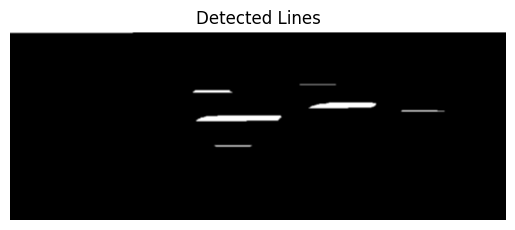

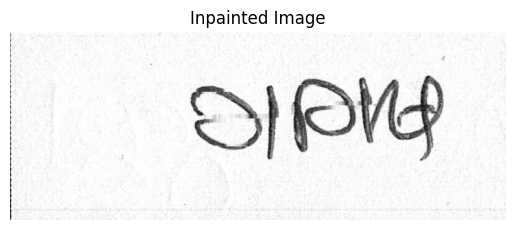

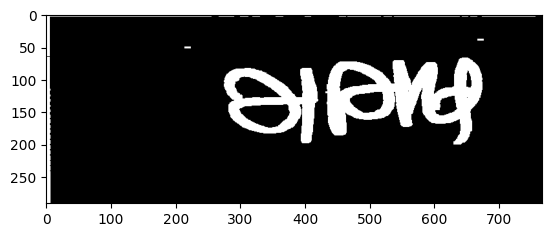

Segmented image with bounding boxes saved as: output2.jpg


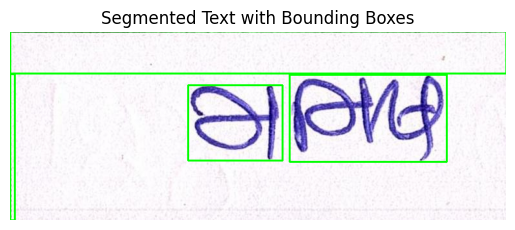

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 4 words in 8.jpg
Processing word box: (0, 0, 767, 65)
Processing word box: (0, 66, 7, 225)
Processing word box: (432, 67, 243, 134)
Processing word box: (275, 83, 146, 116)


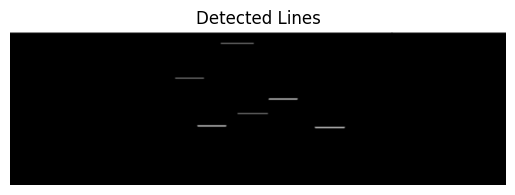

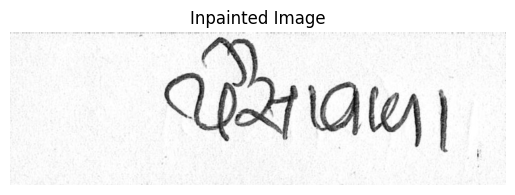

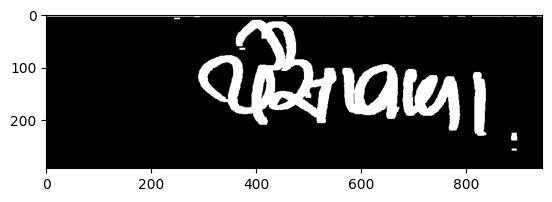

Segmented image with bounding boxes saved as: output2.jpg


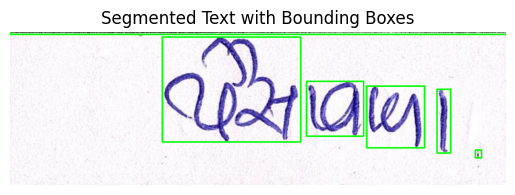

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 6 words in 9.jpg
Processing word box: (0, 0, 946, 6)
Processing word box: (290, 11, 264, 199)
Processing word box: (565, 95, 109, 104)
Processing word box: (680, 104, 110, 117)
Processing word box: (814, 110, 26, 121)
Processing word box: (887, 225, 12, 15)


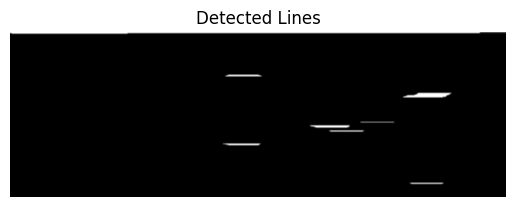

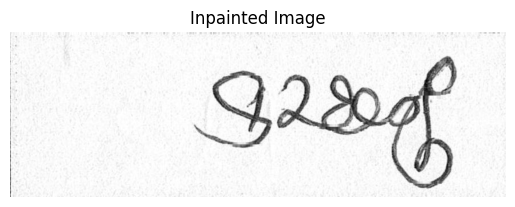

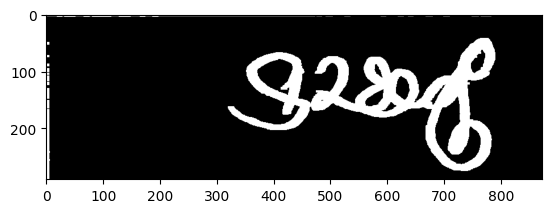

Segmented image with bounding boxes saved as: output2.jpg


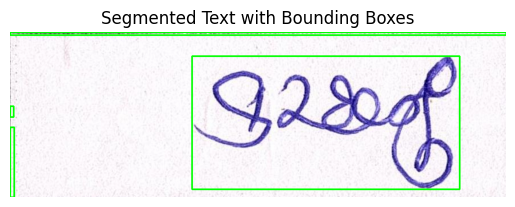

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 4 words in 14.jpg
Processing word box: (0, 0, 873, 5)
Processing word box: (320, 42, 471, 234)
Processing word box: (0, 130, 6, 19)
Processing word box: (0, 167, 7, 123)


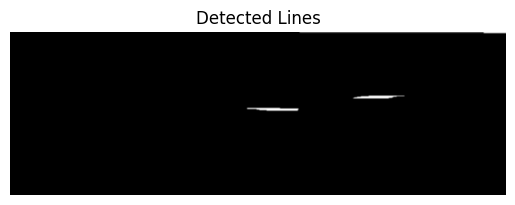

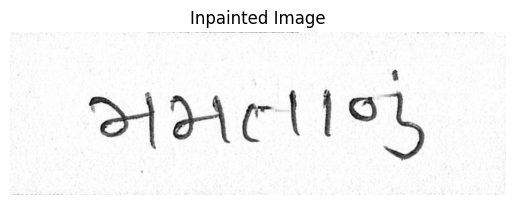

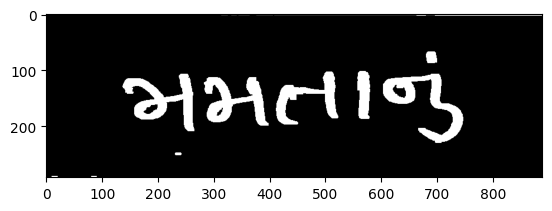

Segmented image with bounding boxes saved as: output2.jpg


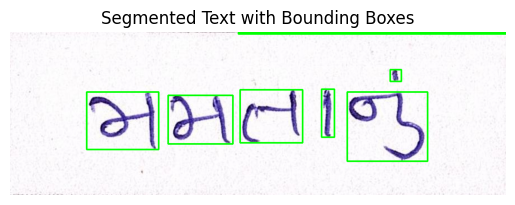

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 7 words in 28.jpg
Processing word box: (409, 0, 480, 3)
Processing word box: (681, 67, 20, 21)
Processing word box: (412, 103, 112, 95)
Processing word box: (558, 102, 23, 86)
Processing word box: (137, 107, 129, 103)
Processing word box: (604, 107, 144, 124)
Processing word box: (283, 113, 116, 87)


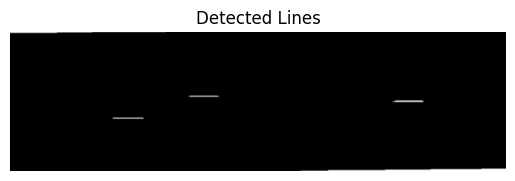

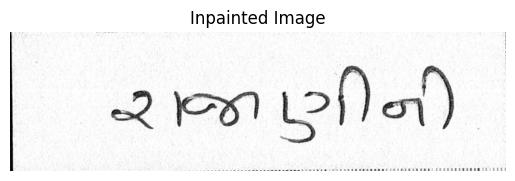

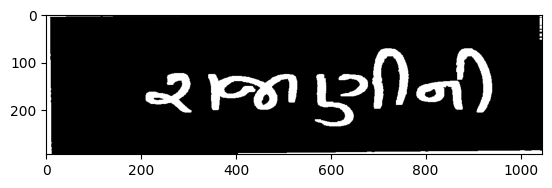

Segmented image with bounding boxes saved as: output2.jpg


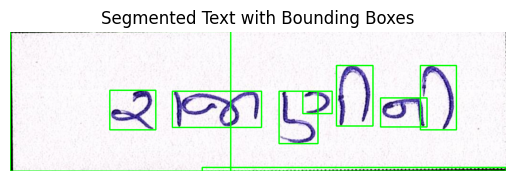

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 9 words in 29.jpg
Processing word box: (0, 0, 465, 294)
Processing word box: (688, 72, 77, 127)
Processing word box: (865, 72, 76, 135)
Processing word box: (210, 124, 97, 83)
Processing word box: (342, 126, 188, 76)
Processing word box: (567, 126, 82, 110)
Processing word box: (617, 126, 62, 47)
Processing word box: (781, 140, 98, 61)
Processing word box: (405, 286, 641, 8)


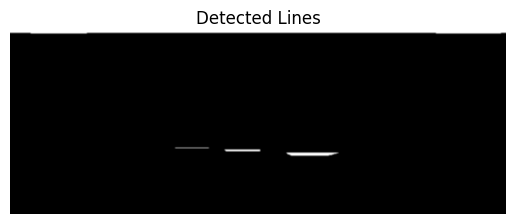

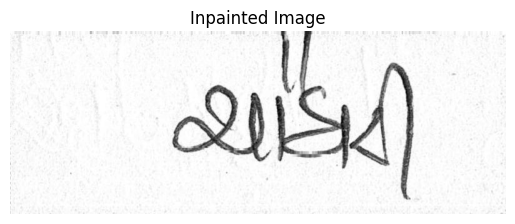

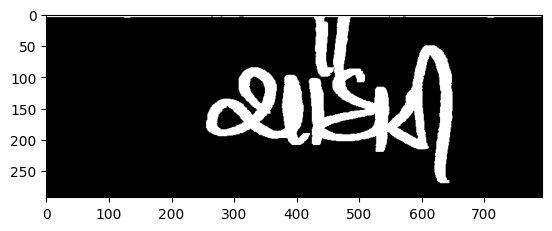

Segmented image with bounding boxes saved as: output2.jpg


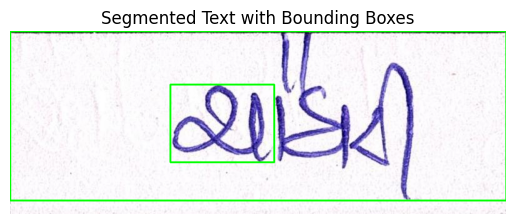

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 2 words in 15.jpg
Processing word box: (0, 0, 793, 270)
Processing word box: (256, 85, 166, 124)


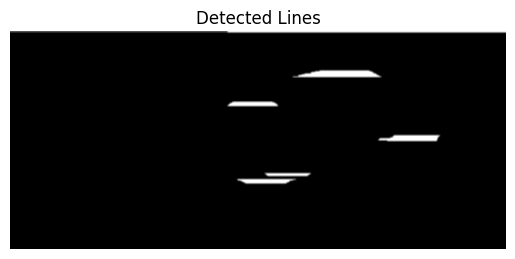

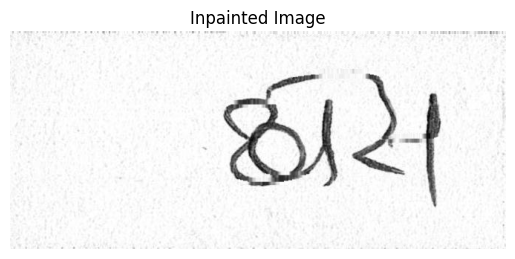

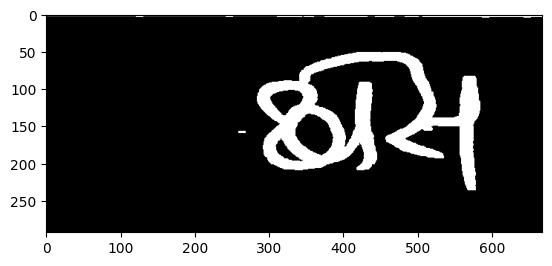

Segmented image with bounding boxes saved as: output2.jpg


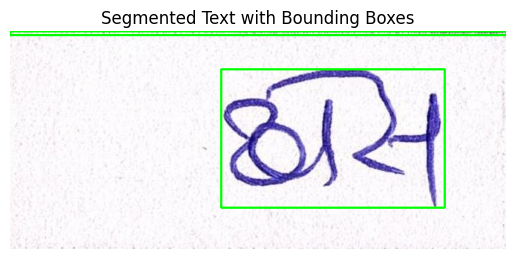

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 2 words in 17.jpg
Processing word box: (0, 0, 668, 5)
Processing word box: (284, 51, 301, 186)


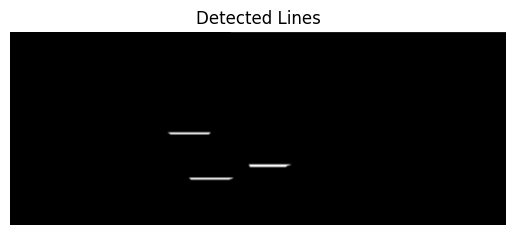

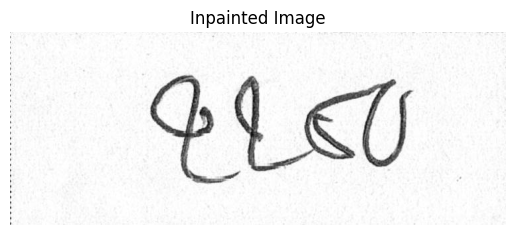

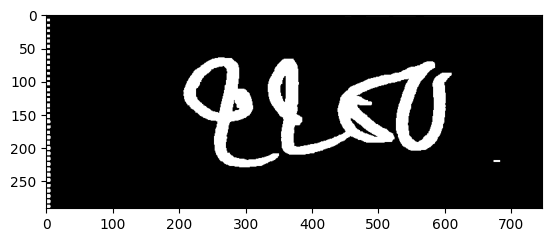

Segmented image with bounding boxes saved as: output2.jpg


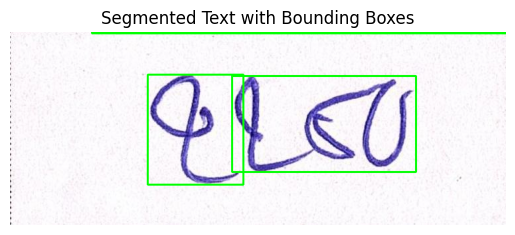

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 3 words in 16.jpg
Processing word box: (123, 0, 624, 3)
Processing word box: (207, 65, 144, 165)
Processing word box: (334, 67, 277, 144)


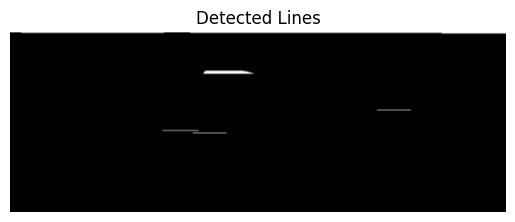

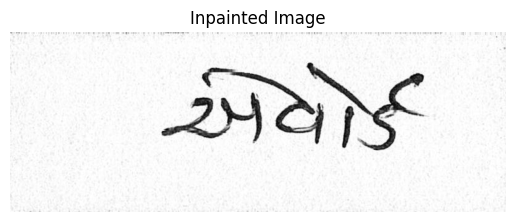

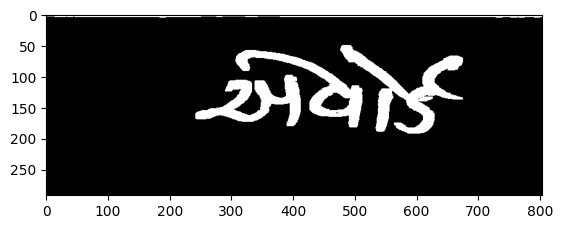

Segmented image with bounding boxes saved as: output2.jpg


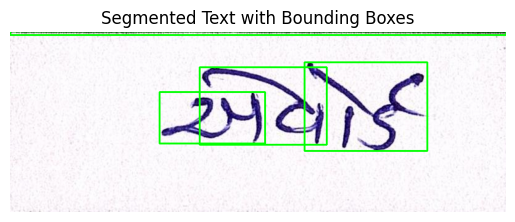

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 4 words in 12.jpg
Processing word box: (0, 0, 804, 6)
Processing word box: (477, 50, 199, 143)
Processing word box: (307, 58, 206, 125)
Processing word box: (242, 98, 171, 83)


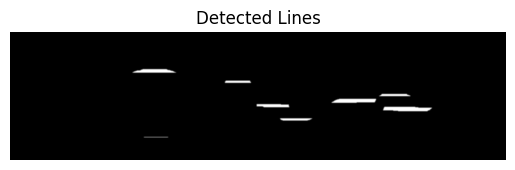

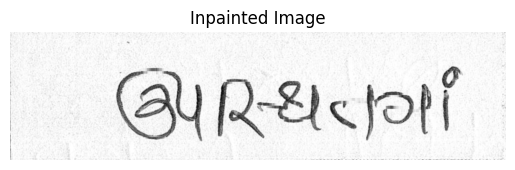

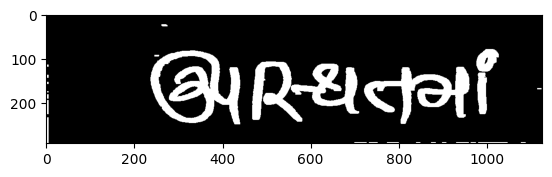

Segmented image with bounding boxes saved as: output2.jpg


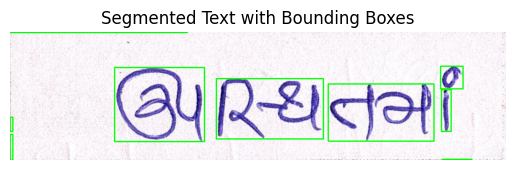

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 9 words in 13.jpg
Processing word box: (0, 0, 402, 3)
Processing word box: (977, 79, 51, 51)
Processing word box: (237, 82, 204, 167)
Processing word box: (468, 107, 243, 136)
Processing word box: (722, 119, 240, 129)
Processing word box: (979, 132, 22, 94)
Processing word box: (0, 194, 6, 32)
Processing word box: (0, 233, 6, 58)
Processing word box: (981, 289, 67, 2)


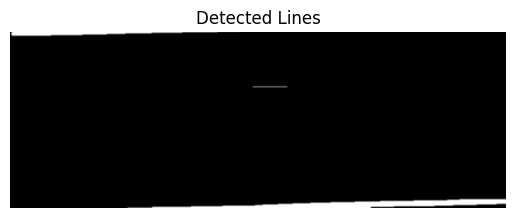

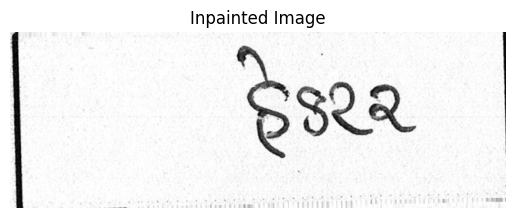

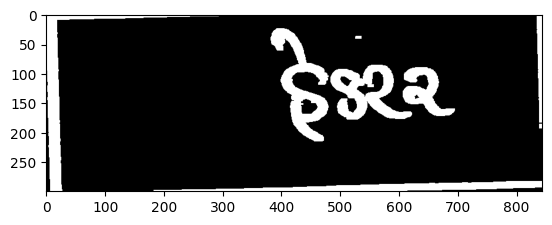

Segmented image with bounding boxes saved as: output2.jpg


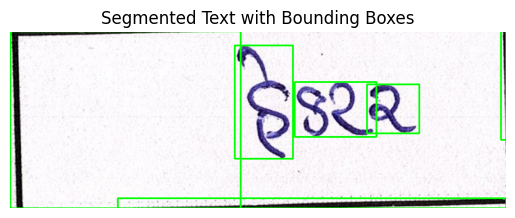

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 6 words in 39.jpg
Processing word box: (0, 0, 392, 300)
Processing word box: (835, 0, 9, 184)
Processing word box: (382, 24, 99, 192)
Processing word box: (484, 86, 139, 93)
Processing word box: (607, 90, 89, 83)
Processing word box: (183, 283, 661, 17)


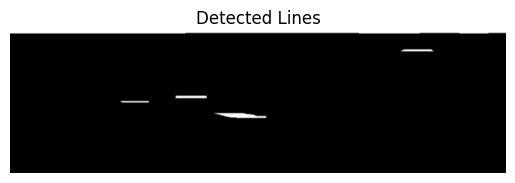

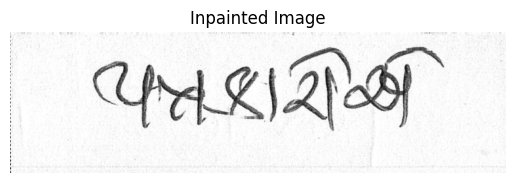

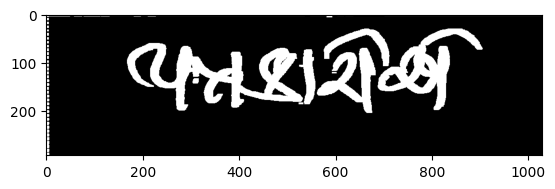

Segmented image with bounding boxes saved as: output2.jpg


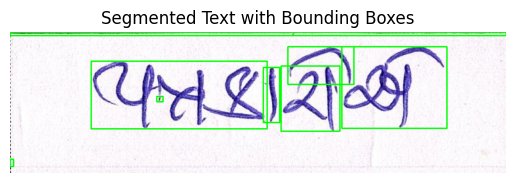

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 8 words in 11.jpg
Processing word box: (0, 0, 1029, 7)
Processing word box: (576, 30, 137, 78)
Processing word box: (688, 30, 218, 169)
Processing word box: (168, 60, 365, 140)
Processing word box: (562, 70, 122, 135)
Processing word box: (525, 73, 34, 114)
Processing word box: (304, 133, 13, 11)
Processing word box: (0, 263, 7, 15)


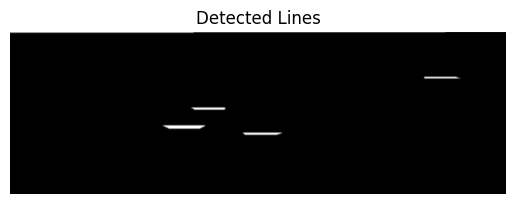

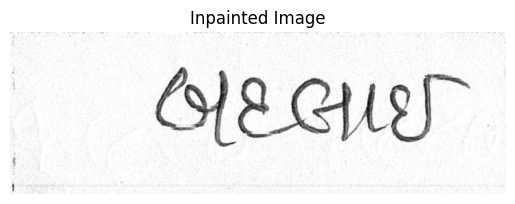

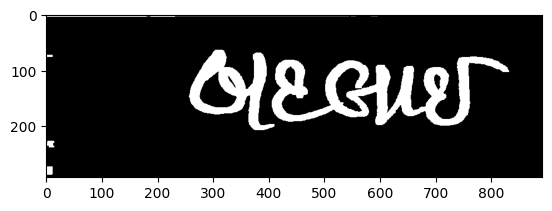

Segmented image with bounding boxes saved as: output2.jpg


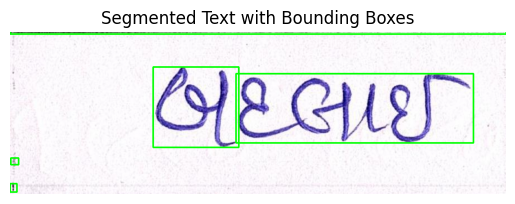

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 5 words in 10.jpg
Processing word box: (0, 0, 892, 5)
Processing word box: (257, 64, 154, 144)
Processing word box: (406, 76, 427, 124)
Processing word box: (1, 227, 14, 12)
Processing word box: (0, 273, 12, 15)


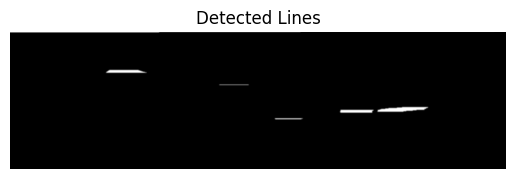

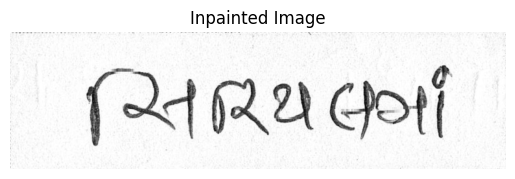

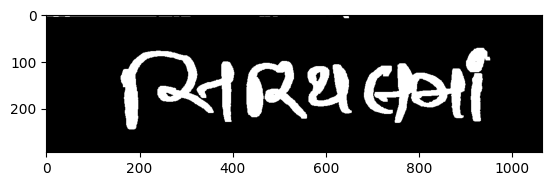

Segmented image with bounding boxes saved as: output2.jpg


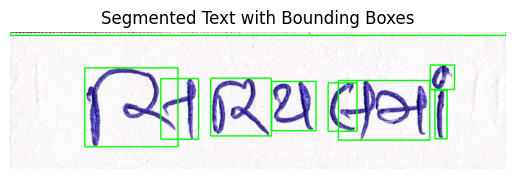

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 9 words in 38.jpg
Processing word box: (0, 0, 1064, 9)
Processing word box: (901, 72, 52, 52)
Processing word box: (160, 78, 200, 168)
Processing word box: (323, 101, 81, 129)
Processing word box: (430, 100, 130, 123)
Processing word box: (704, 105, 196, 127)
Processing word box: (561, 107, 95, 105)
Processing word box: (682, 110, 62, 103)
Processing word box: (911, 126, 26, 103)


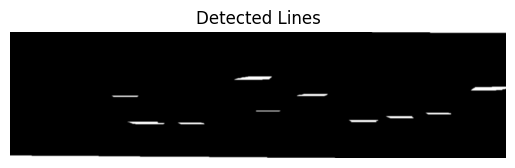

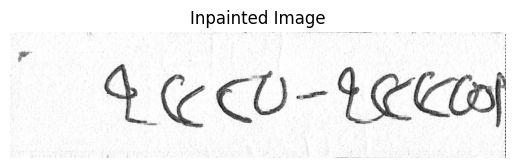

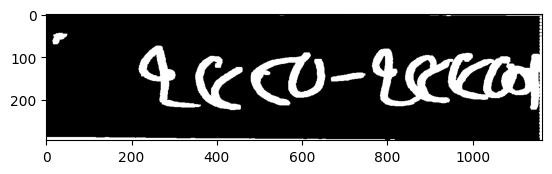

Segmented image with bounding boxes saved as: output2.jpg


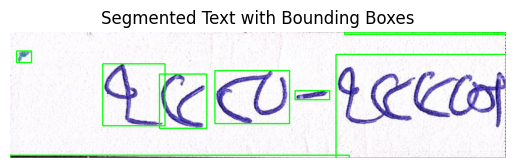

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 8 words in 21.jpg
Processing word box: (784, 0, 379, 5)
Processing word box: (15, 44, 35, 27)
Processing word box: (764, 52, 399, 243)
Processing word box: (217, 74, 146, 145)
Processing word box: (480, 90, 175, 124)
Processing word box: (350, 98, 111, 127)
Processing word box: (668, 137, 81, 21)
Processing word box: (0, 288, 795, 7)


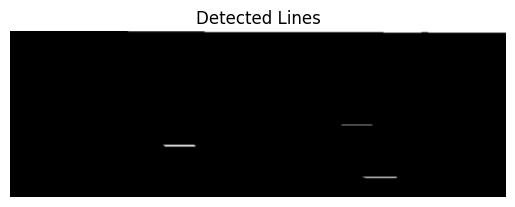

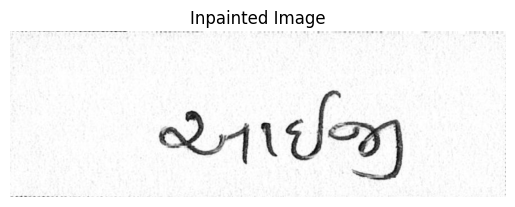

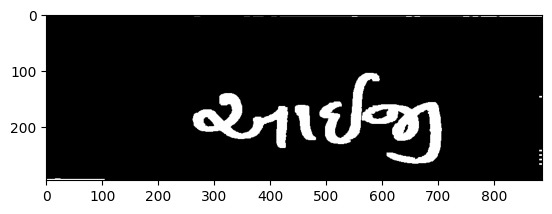

Segmented image with bounding boxes saved as: output2.jpg


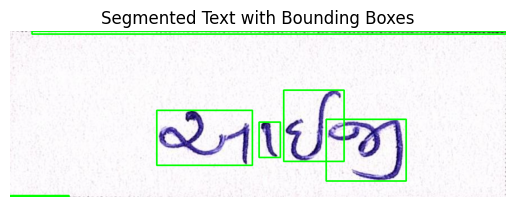

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 6 words in 35.jpg
Processing word box: (39, 0, 848, 5)
Processing word box: (489, 105, 108, 127)
Processing word box: (262, 141, 171, 98)
Processing word box: (565, 157, 143, 110)
Processing word box: (445, 162, 38, 63)
Processing word box: (0, 293, 105, 3)


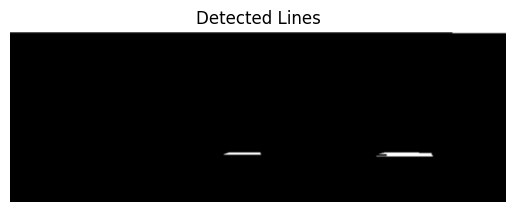

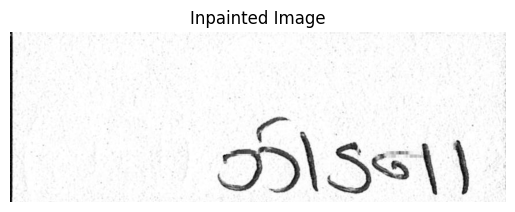

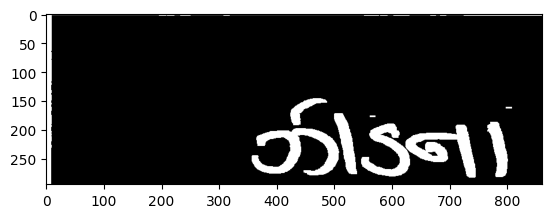

Segmented image with bounding boxes saved as: output2.jpg


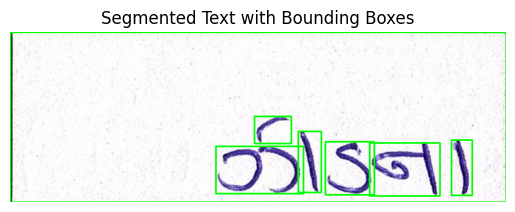

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 7 words in 34.jpg
Processing word box: (0, 0, 861, 295)
Processing word box: (424, 146, 64, 47)
Processing word box: (500, 172, 40, 106)
Processing word box: (766, 187, 36, 96)
Processing word box: (547, 190, 85, 92)
Processing word box: (624, 192, 122, 92)
Processing word box: (357, 198, 152, 82)


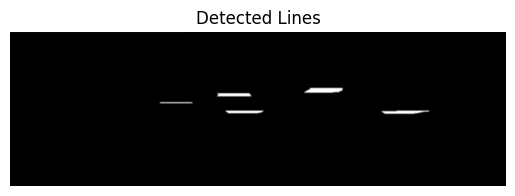

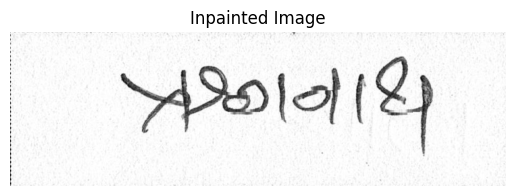

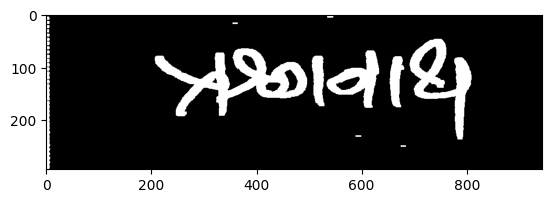

Segmented image with bounding boxes saved as: output2.jpg


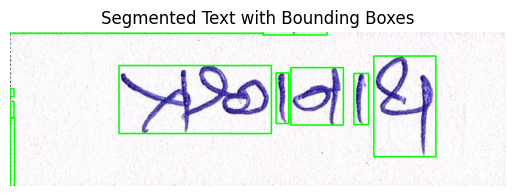

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 10 words in 20.jpg
Processing word box: (0, 0, 480, 4)
Processing word box: (481, 0, 122, 7)
Processing word box: (692, 47, 118, 191)
Processing word box: (207, 65, 290, 129)
Processing word box: (534, 69, 100, 109)
Processing word box: (506, 79, 24, 96)
Processing word box: (654, 80, 28, 97)
Processing word box: (0, 109, 7, 15)
Processing word box: (0, 133, 7, 31)
Processing word box: (0, 165, 8, 129)


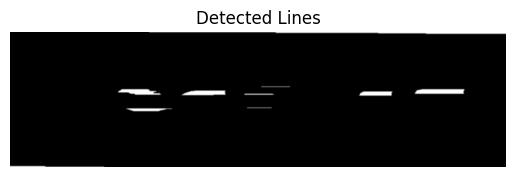

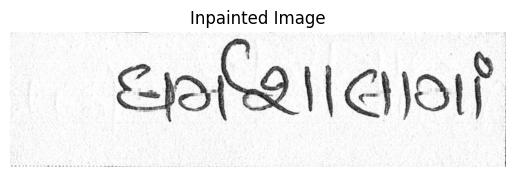

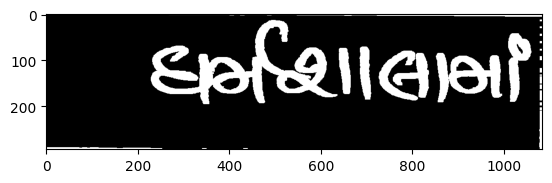

Segmented image with bounding boxes saved as: output2.jpg


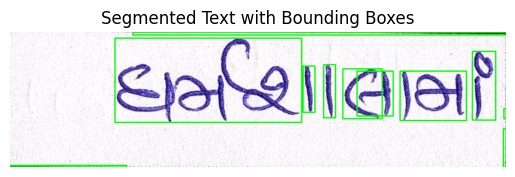

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 11 words in 36.jpg
Processing word box: (268, 0, 816, 6)
Processing word box: (229, 13, 408, 184)
Processing word box: (1010, 42, 51, 150)
Processing word box: (685, 71, 26, 116)
Processing word box: (640, 74, 26, 101)
Processing word box: (727, 80, 86, 109)
Processing word box: (758, 85, 79, 98)
Processing word box: (852, 85, 145, 108)
Processing word box: (1079, 167, 5, 22)
Processing word box: (1078, 211, 6, 84)
Processing word box: (0, 291, 254, 4)


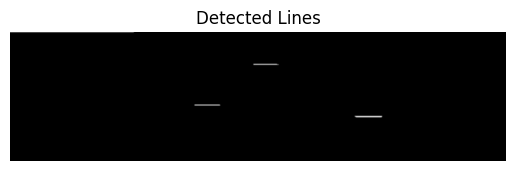

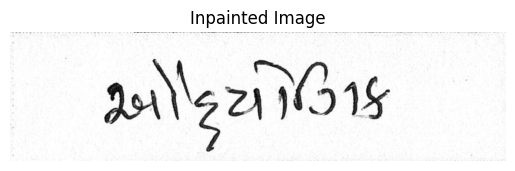

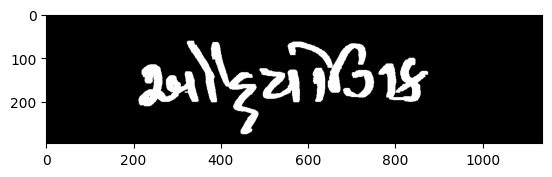

Segmented image with bounding boxes saved as: output2.jpg


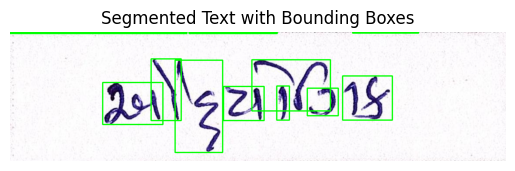

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 11 words in 22.jpg
Processing word box: (0, 0, 405, 3)
Processing word box: (410, 0, 202, 3)
Processing word box: (785, 0, 151, 2)
Processing word box: (323, 61, 69, 141)
Processing word box: (554, 63, 180, 117)
Processing word box: (378, 64, 109, 211)
Processing word box: (762, 100, 114, 101)
Processing word box: (212, 115, 138, 96)
Processing word box: (611, 123, 29, 78)
Processing word box: (489, 124, 93, 78)
Processing word box: (681, 128, 71, 63)


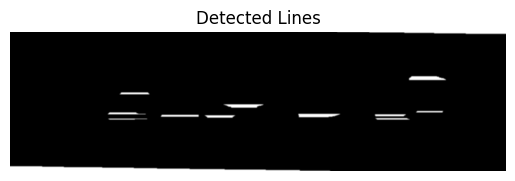

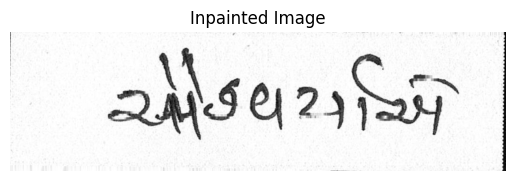

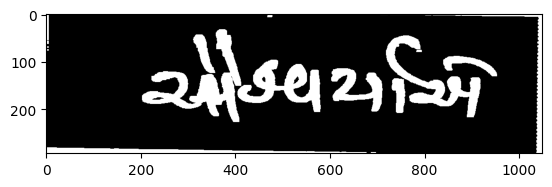

Segmented image with bounding boxes saved as: output2.jpg


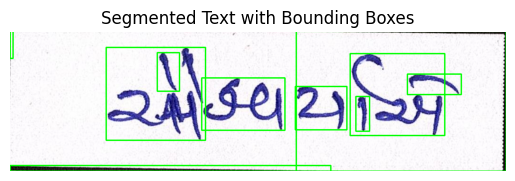

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 10 words in 23.jpg
Processing word box: (0, 0, 6, 57)
Processing word box: (605, 0, 444, 294)
Processing word box: (203, 34, 210, 195)
Processing word box: (311, 45, 47, 81)
Processing word box: (719, 47, 200, 172)
Processing word box: (840, 90, 114, 43)
Processing word box: (405, 98, 176, 110)
Processing word box: (603, 116, 109, 91)
Processing word box: (731, 137, 29, 73)
Processing word box: (0, 282, 678, 12)


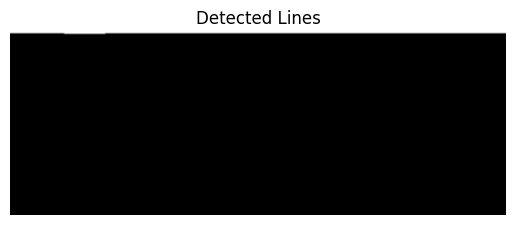

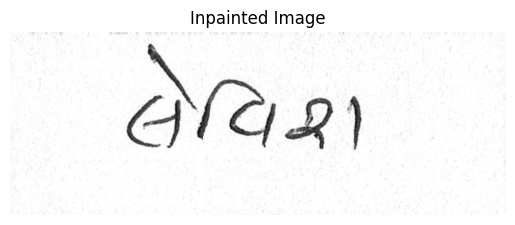

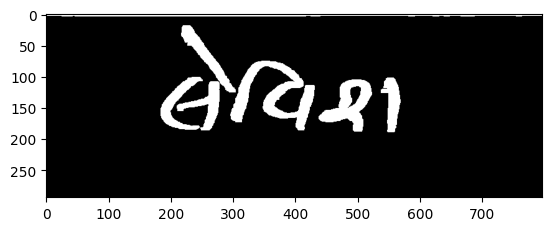

Segmented image with bounding boxes saved as: output2.jpg


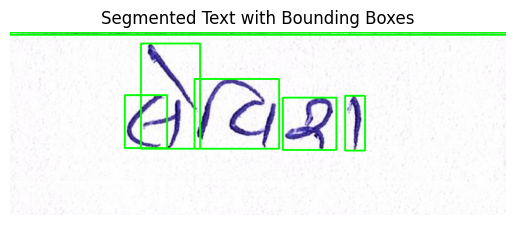

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 6 words in 37.jpg
Processing word box: (0, 0, 797, 4)
Processing word box: (210, 18, 95, 169)
Processing word box: (296, 75, 136, 112)
Processing word box: (184, 101, 68, 85)
Processing word box: (538, 102, 32, 88)
Processing word box: (438, 105, 86, 84)


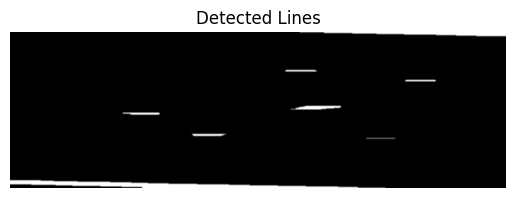

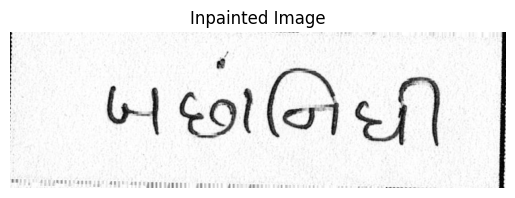

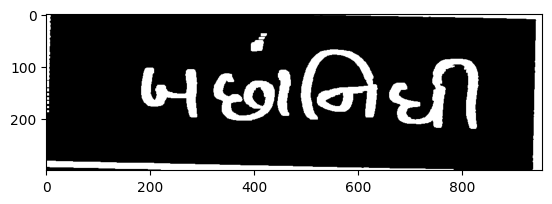

Segmented image with bounding boxes saved as: output2.jpg


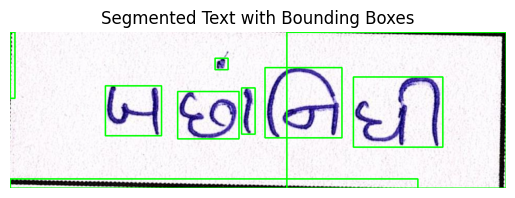

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 9 words in 33.jpg
Processing word box: (0, 0, 9, 127)
Processing word box: (532, 0, 422, 300)
Processing word box: (394, 50, 25, 22)
Processing word box: (490, 68, 148, 135)
Processing word box: (660, 86, 172, 135)
Processing word box: (183, 103, 108, 96)
Processing word box: (445, 107, 26, 89)
Processing word box: (322, 114, 118, 91)
Processing word box: (0, 282, 784, 18)


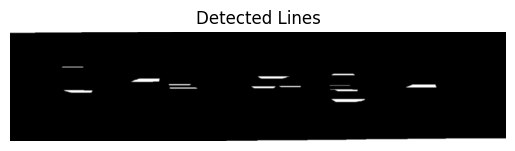

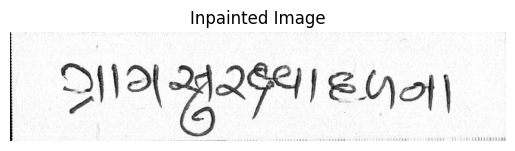

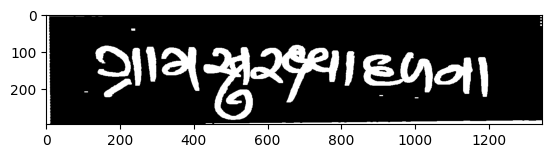

Segmented image with bounding boxes saved as: output2.jpg


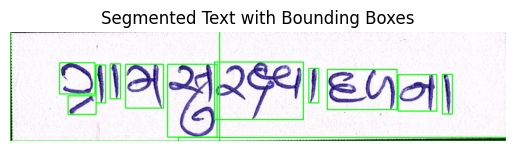

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 13 words in 27.jpg
Processing word box: (0, 0, 568, 296)
Processing word box: (554, 83, 241, 155)
Processing word box: (134, 85, 96, 84)
Processing word box: (271, 88, 28, 94)
Processing word box: (313, 89, 103, 118)
Processing word box: (427, 89, 134, 196)
Processing word box: (233, 91, 26, 102)
Processing word box: (810, 100, 27, 93)
Processing word box: (860, 103, 189, 108)
Processing word box: (1052, 117, 105, 98)
Processing word box: (1172, 116, 27, 107)
Processing word box: (157, 174, 76, 50)
Processing word box: (456, 286, 889, 10)


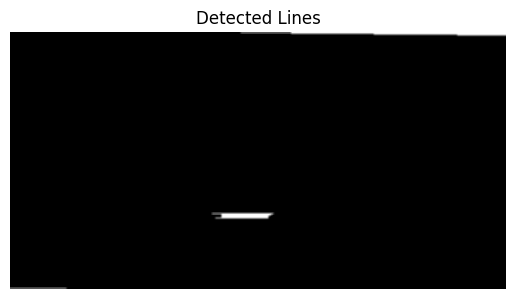

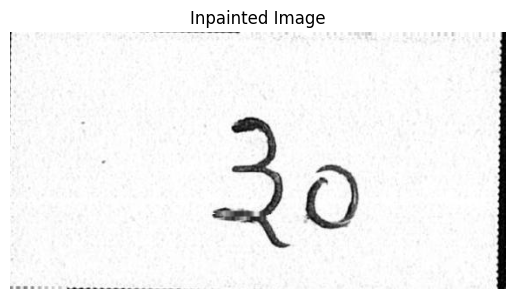

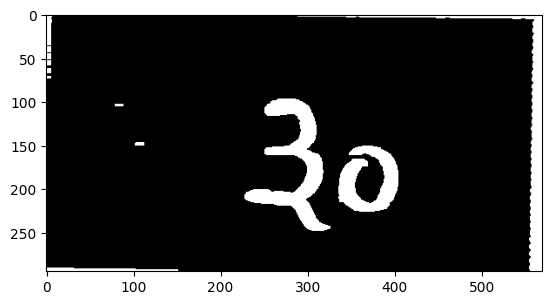

Segmented image with bounding boxes saved as: output2.jpg


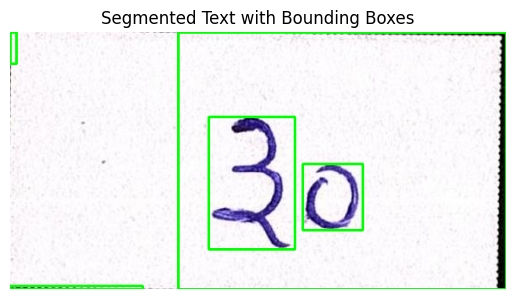

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 5 words in 26.jpg
Processing word box: (0, 0, 7, 36)
Processing word box: (193, 0, 377, 295)
Processing word box: (228, 97, 99, 152)
Processing word box: (336, 151, 69, 76)
Processing word box: (0, 291, 152, 4)


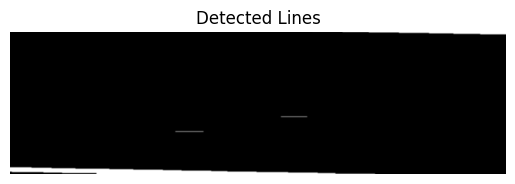

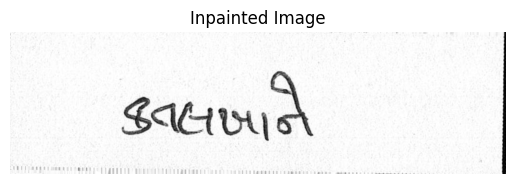

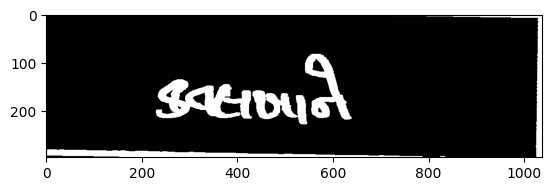

Segmented image with bounding boxes saved as: output2.jpg


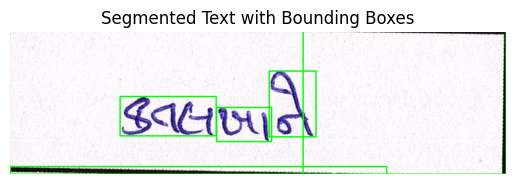

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 5 words in 32.jpg
Processing word box: (613, 0, 425, 298)
Processing word box: (542, 83, 98, 137)
Processing word box: (230, 136, 201, 82)
Processing word box: (432, 159, 115, 71)
Processing word box: (0, 282, 788, 16)


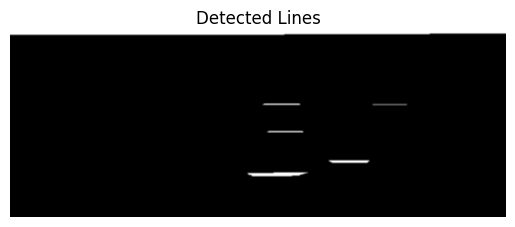

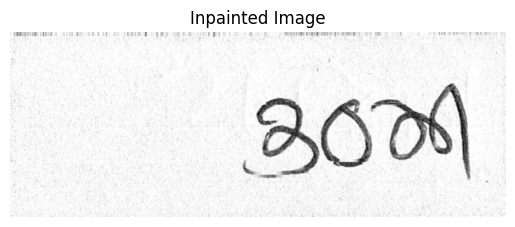

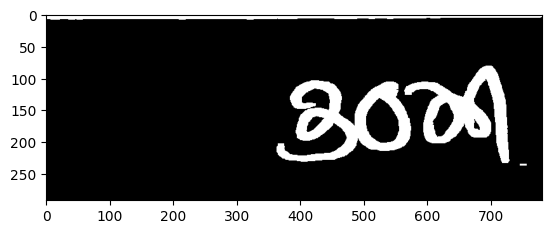

Segmented image with bounding boxes saved as: output2.jpg


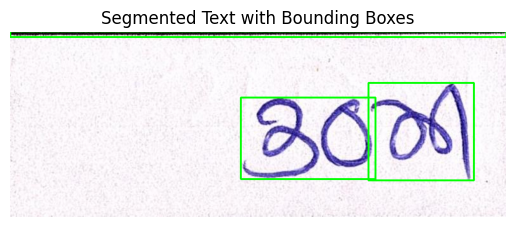

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 3 words in 18.jpg
Processing word box: (0, 0, 781, 9)
Processing word box: (564, 81, 166, 153)
Processing word box: (363, 104, 212, 128)


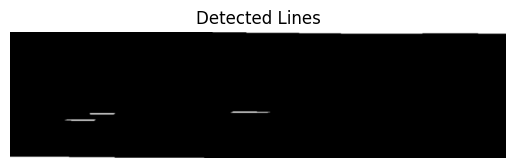

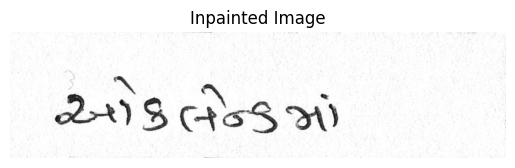

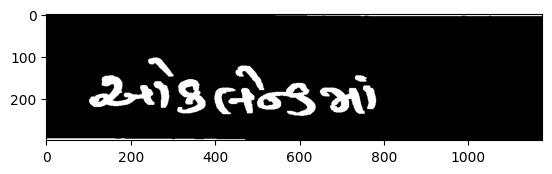

Segmented image with bounding boxes saved as: output2.jpg


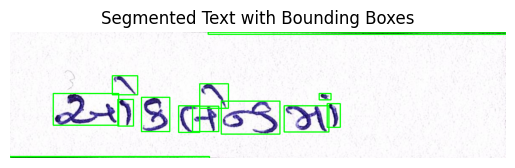

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 13 words in 24.jpg
Processing word box: (469, 0, 706, 5)
Processing word box: (242, 103, 60, 45)
Processing word box: (449, 122, 68, 58)
Processing word box: (102, 145, 155, 75)
Processing word box: (732, 145, 28, 15)
Processing word box: (311, 154, 67, 81)
Processing word box: (255, 159, 37, 63)
Processing word box: (500, 163, 139, 78)
Processing word box: (751, 169, 31, 56)
Processing word box: (399, 174, 50, 63)
Processing word box: (432, 175, 62, 60)
Processing word box: (649, 174, 106, 62)
Processing word box: (0, 294, 472, 4)


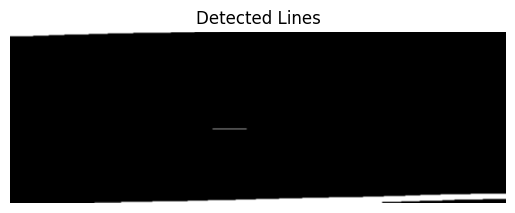

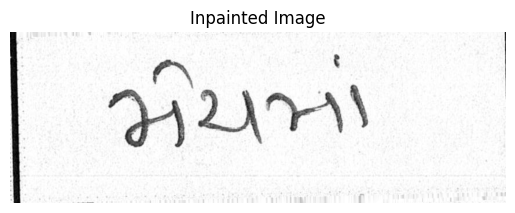

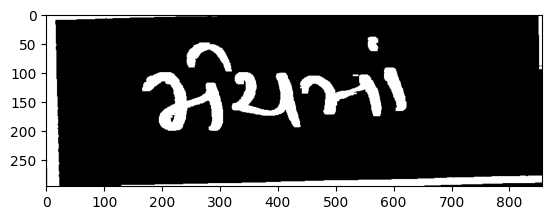

Segmented image with bounding boxes saved as: output2.jpg


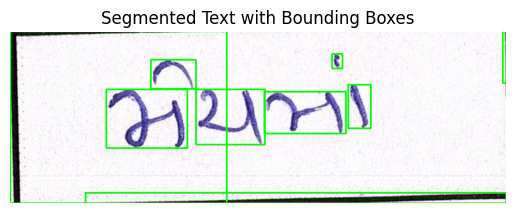

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 9 words in 30.jpg
Processing word box: (0, 0, 374, 296)
Processing word box: (851, 0, 6, 89)
Processing word box: (556, 39, 18, 25)
Processing word box: (243, 49, 78, 50)
Processing word box: (584, 92, 39, 75)
Processing word box: (166, 100, 140, 101)
Processing word box: (321, 100, 119, 95)
Processing word box: (439, 104, 141, 72)
Processing word box: (130, 278, 727, 18)


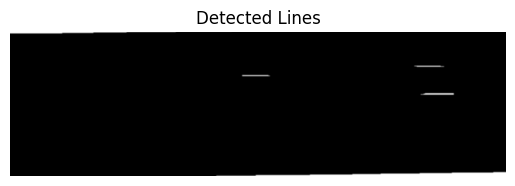

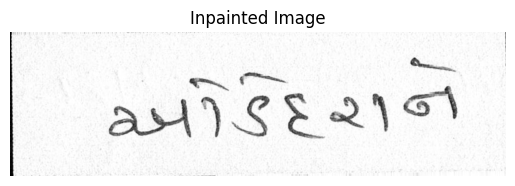

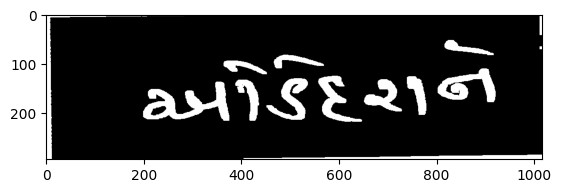

Segmented image with bounding boxes saved as: output2.jpg


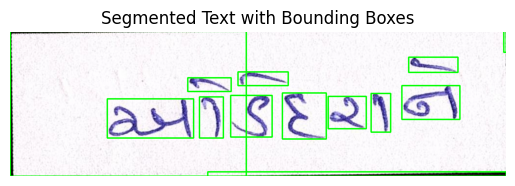

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 13 words in 31.jpg
Processing word box: (0, 0, 484, 296)
Processing word box: (1012, 0, 5, 43)
Processing word box: (817, 53, 101, 31)
Processing word box: (467, 83, 103, 28)
Processing word box: (364, 95, 89, 28)
Processing word box: (803, 111, 119, 69)
Processing word box: (558, 126, 90, 94)
Processing word box: (740, 127, 40, 79)
Processing word box: (452, 131, 85, 85)
Processing word box: (652, 133, 78, 66)
Processing word box: (388, 134, 49, 84)
Processing word box: (199, 138, 177, 80)
Processing word box: (405, 287, 612, 9)


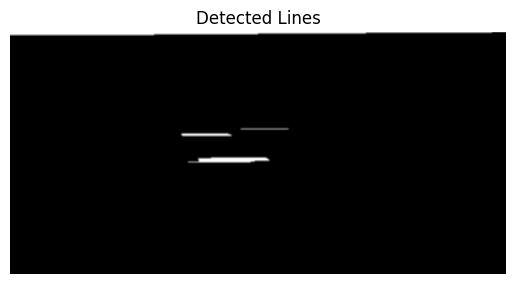

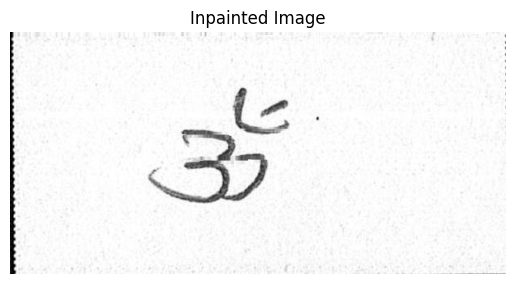

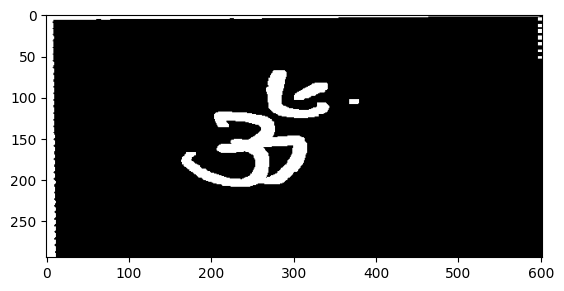

Segmented image with bounding boxes saved as: output2.jpg


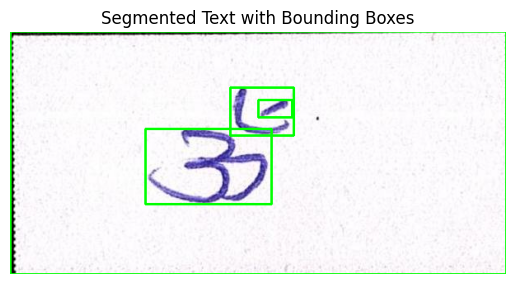

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 4 words in 25.jpg
Processing word box: (0, 0, 602, 294)
Processing word box: (267, 68, 77, 58)
Processing word box: (301, 83, 41, 21)
Processing word box: (164, 118, 153, 91)


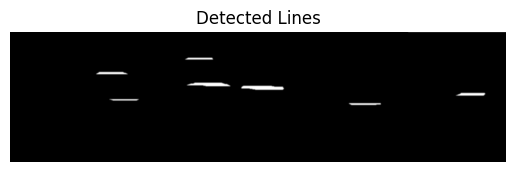

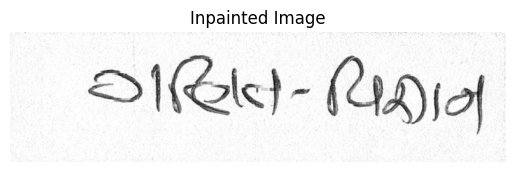

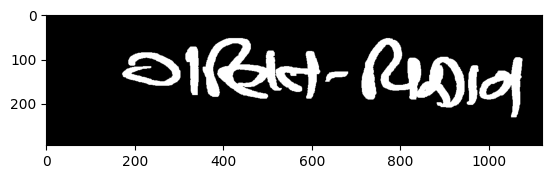

Segmented image with bounding boxes saved as: output2.jpg


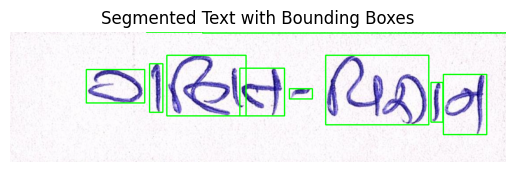

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 10 words in 19.jpg
Processing word box: (308, 0, 124, 2)
Processing word box: (435, 0, 686, 4)
Processing word box: (354, 54, 179, 136)
Processing word box: (713, 54, 233, 156)
Processing word box: (315, 73, 30, 109)
Processing word box: (519, 83, 101, 107)
Processing word box: (172, 86, 132, 75)
Processing word box: (979, 97, 98, 135)
Processing word box: (951, 115, 27, 89)
Processing word box: (631, 129, 52, 23)


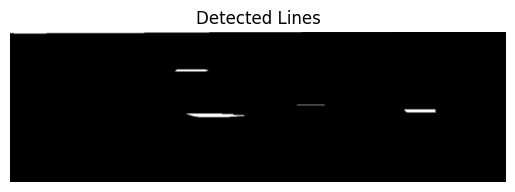

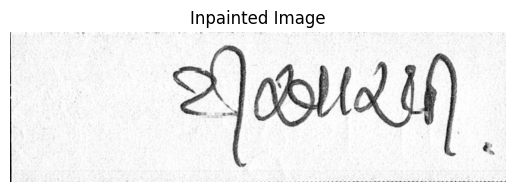

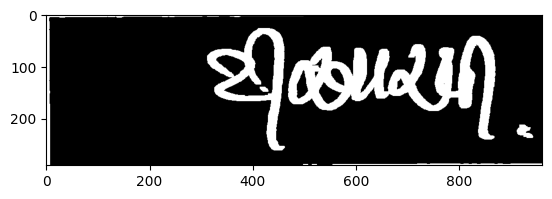

Segmented image with bounding boxes saved as: output2.jpg


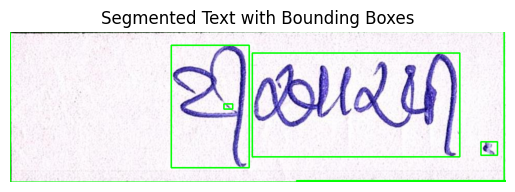

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 6 words in 4.jpg
Processing word box: (0, 0, 957, 291)
Processing word box: (312, 27, 151, 236)
Processing word box: (469, 42, 402, 200)
Processing word box: (414, 140, 17, 10)
Processing word box: (912, 213, 32, 26)
Processing word box: (555, 288, 406, 3)


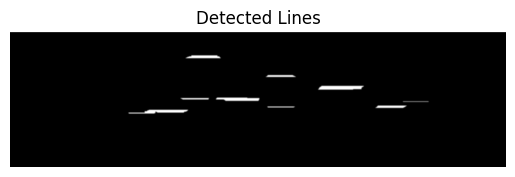

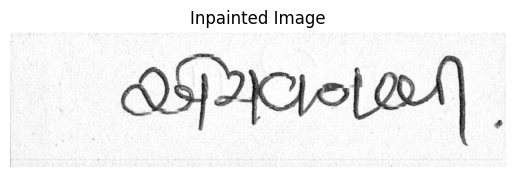

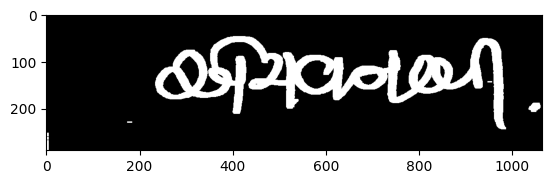

Segmented image with bounding boxes saved as: output2.jpg


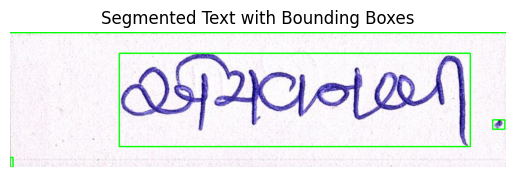

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 4 words in 5.jpg
Processing word box: (0, 0, 1064, 3)
Processing word box: (234, 47, 753, 199)
Processing word box: (1035, 189, 26, 20)
Processing word box: (0, 269, 6, 21)


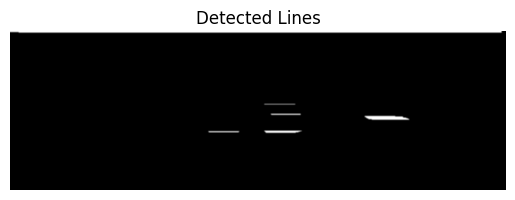

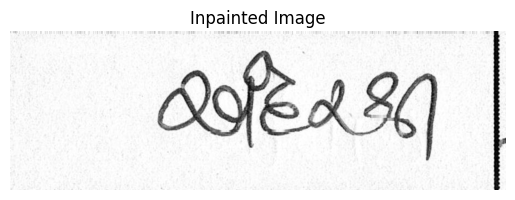

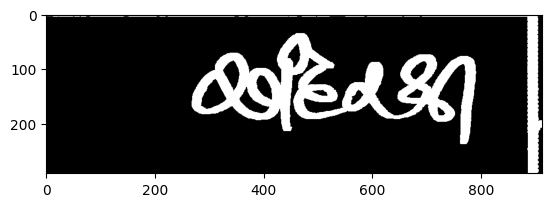

Segmented image with bounding boxes saved as: output2.jpg


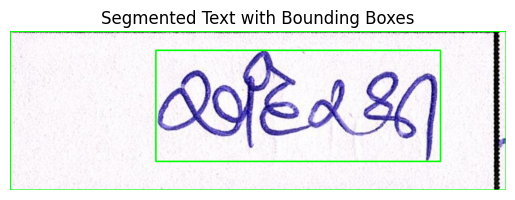

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 2 words in 7.jpg
Processing word box: (0, 0, 913, 292)
Processing word box: (268, 35, 524, 204)


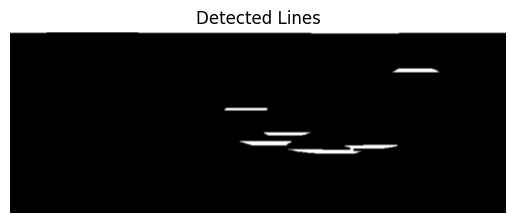

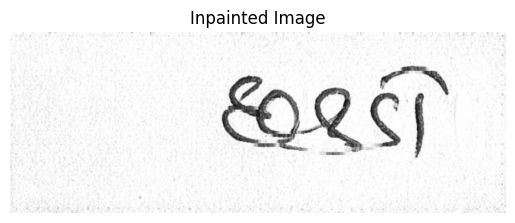

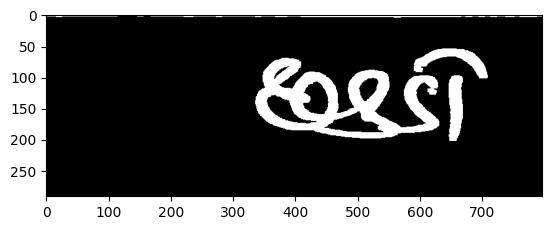

Segmented image with bounding boxes saved as: output2.jpg


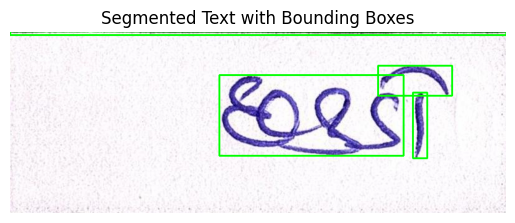

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 4 words in 40.jpg
Processing word box: (0, 0, 797, 6)
Processing word box: (591, 55, 119, 48)
Processing word box: (336, 70, 296, 129)
Processing word box: (647, 98, 23, 105)


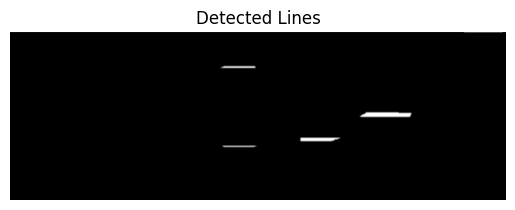

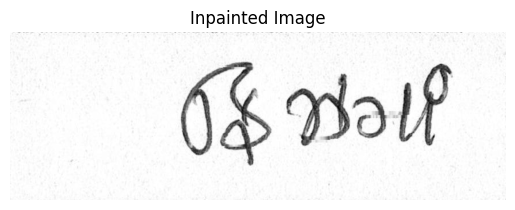

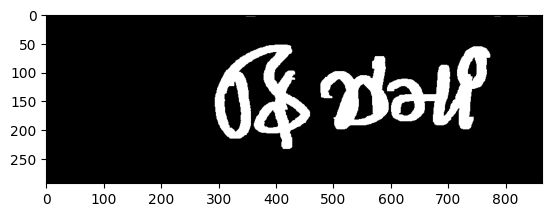

Segmented image with bounding boxes saved as: output2.jpg


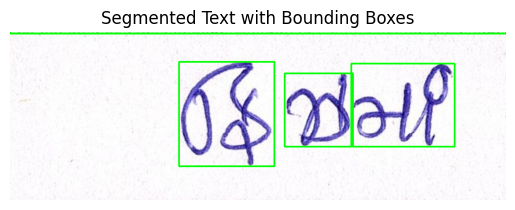

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 4 words in 6.jpg
Processing word box: (0, 0, 864, 4)
Processing word box: (294, 53, 166, 181)
Processing word box: (594, 56, 180, 144)
Processing word box: (478, 73, 119, 127)


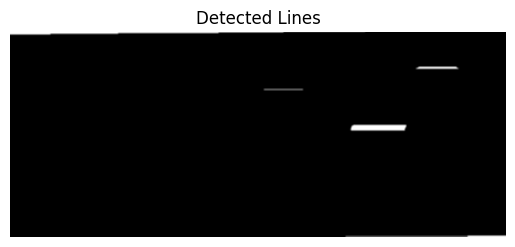

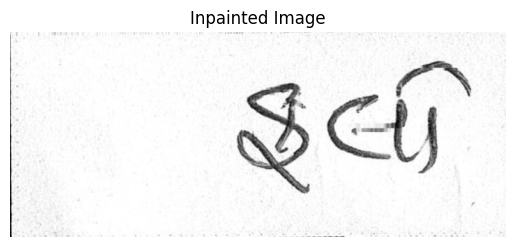

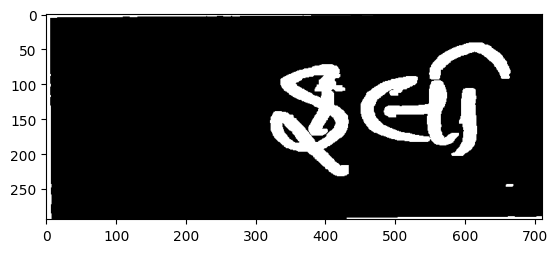

Segmented image with bounding boxes saved as: output2.jpg


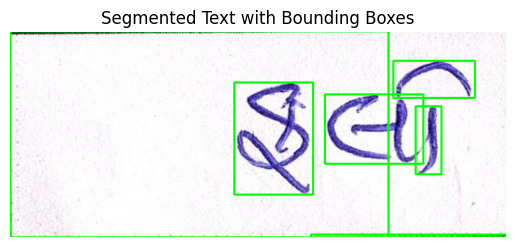

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 6 words in 2.jpg
Processing word box: (0, 0, 542, 294)
Processing word box: (549, 42, 117, 53)
Processing word box: (321, 73, 113, 160)
Processing word box: (451, 90, 141, 99)
Processing word box: (581, 107, 37, 97)
Processing word box: (431, 290, 280, 4)


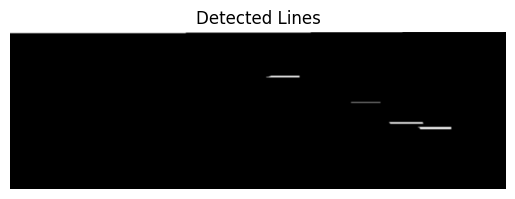

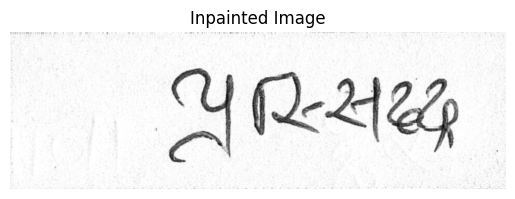

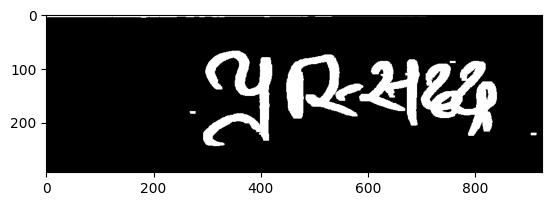

Segmented image with bounding boxes saved as: output2.jpg


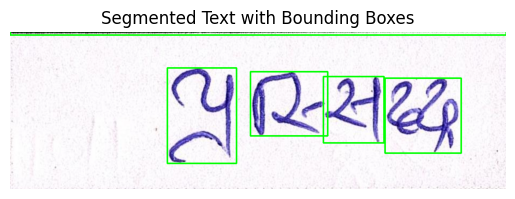

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 5 words in 3.jpg
Processing word box: (0, 0, 925, 7)
Processing word box: (293, 68, 129, 177)
Processing word box: (448, 75, 144, 119)
Processing word box: (584, 84, 113, 123)
Processing word box: (699, 87, 142, 139)


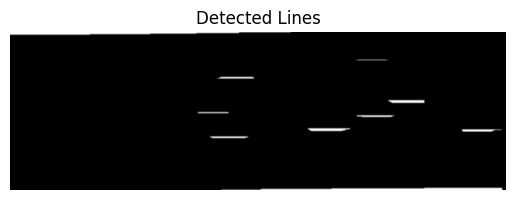

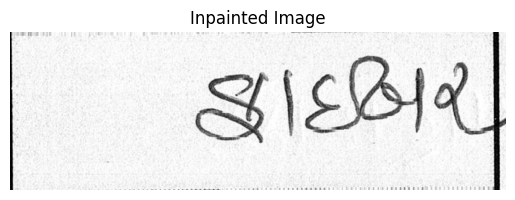

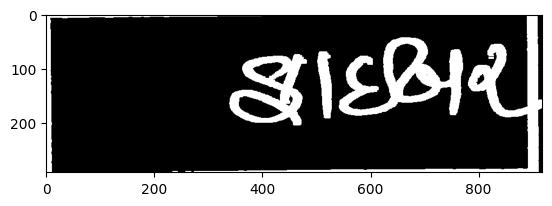

Segmented image with bounding boxes saved as: output2.jpg


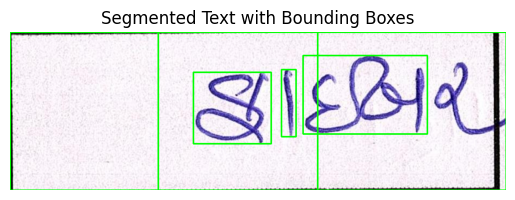

Segmented image with bounding boxes saved as: output2_opencv.jpg
Processing 5 words in 1.jpg
Processing word box: (0, 0, 569, 292)
Processing word box: (274, 0, 644, 292)
Processing word box: (542, 43, 230, 145)
Processing word box: (502, 69, 27, 124)
Processing word box: (339, 74, 144, 132)
Feature values written to output_features.csv


In [74]:
import os
import pandas as pd

# Define the directory containing the images
image_dir = 'Gujarati'

# List all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]

# Initialize lists to store feature values
image_ids = []
deviations_dw = []
deviations_dh = []
deviations_da = []
densities = []
vertical_projection_variances = []
pixels_distributions = []
major_horizontal_projection_differences = []
bottom_lines = []
black_pixels_each_line_list = [] 

# Iterate over each image file
for image_file in image_files:
    # Read the image
    image_path = os.path.join(image_dir, image_file)
    binary_image = removeLines(image_path)
    word_boxes = text_segmentation(image_path)

    # Check if any words are detected
    if not word_boxes:
        print(f"No words detected in {image_file}. Skipping...")
        continue

    # Calculate features for each word bounding box
    print(f"Processing {len(word_boxes)} words in {image_file}")
    for box in word_boxes:
        print(f"Processing word box: {box}")
        deviations = calculate_deviations([box])
        density = calculate_density(binary_image, box)
        vertical_projection_variance = calculate_vertical_projection_variance(binary_image, box)
        pixels_distribution = calculate_pixels_distribution(binary_image, box)
        major_horizontal_projection_difference = calculate_major_horizontal_projection_difference(binary_image, box)
        bottom_line = calculate_bottom_line(binary_image, box)
        black_pixels_each_line_val = calculate_black_pixels_each_line(binary_image, box)  # Rename the variable
        # vertical_edges = calculate_vertical_edges(binary_image, box)
        # major_vertical_edges = calculate_major_vertical_edge_single(binary_image, box)

        # Append feature values to lists
        image_ids.append(image_file)
        deviations_dw.append(deviations['DW'])
        deviations_dh.append(deviations['DH'])
        deviations_da.append(deviations['DA'])
        densities.append(density)
        vertical_projection_variances.append(vertical_projection_variance)
        pixels_distributions.append(pixels_distribution)
        major_horizontal_projection_differences.append(major_horizontal_projection_difference)
        bottom_lines.append(bottom_line)
        black_pixels_each_line_list.append(black_pixels_each_line_val)  # Append to the list variable
        # vertical_edges.append(vertical_edges)
        # major_vertical_edges.append(major_vertical_edges)

# Create a DataFrame to store feature values
data = {
    'Image ID': image_ids,
    'Deviation of Widths (DW)': deviations_dw,
    'Deviation of Heights (DH)': deviations_dh,
    'Deviation of Areas (DA)': deviations_da,
    'Density': densities,
    'Vertical Projection Variance': vertical_projection_variances,
    'Pixels Distribution': pixels_distributions,
    'Major Horizontal Projection Difference': major_horizontal_projection_differences,
    'Bottom Line': bottom_lines,
    'Black Pixels Each Line': black_pixels_each_line_list,  # Use the renamed variable here
    # 'Vertical Edges': vertical_edges,
    # 'Major Vertical Edge': major_vertical_edges
}

# Convert the data to a DataFrame
df = pd.DataFrame(data)

# Write the DataFrame to a CSV file
output_csv = 'output_features.csv'
df.to_csv(output_csv, index=False)
print(f"Feature values written to {output_csv}")


In [75]:
import os
import pandas as pd

df = pd.read_csv('output_features.csv')
df_sorted = df.sort_values(by='Image ID', ascending=True)
output_sorted_csv = 'output_features_sorted.csv'
df_sorted.to_csv(output_sorted_csv, index=False)
print(f"Sorted feature values written to {output_sorted_csv}")


Sorted feature values written to output_features_sorted.csv


In [ ]:
""